In [ ]:
# Avoids scroll-in-the-scroll in the entire Notebook
from IPython.display import Javascript
def resize_colab_cell():
  display(Javascript('google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#U-Net inspired Autoencoder

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from keras.models import Model
from keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Step 1: Load Images
def load_images(folder_path, target_size=(256, 256)):
    """
    Load all images from a folder and preprocess them to the required size and scale.
    """
    images = []
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(folder_path, filename)
            img = load_img(img_path, target_size=target_size)
            img_array = img_to_array(img).astype('float32') / 255.0
            images.append(img_array)
    return np.array(images)

# Provide dataset directory path
folder_path = "/content/drive/MyDrive/deeeep/deep learning project"  # Replace with your dataset path
images = load_images(folder_path)

# Verify that images were loaded
if len(images) == 0:
    raise ValueError("No images found in the provided folder path.")
#print(f"Loaded {len(images)} images with shape {images[0].shape}.")

# Step 2: Add Noise
def add_noise(images, noise_factor=0.3):
    """
    Add random Gaussian noise to images and clip to [0, 1].
    """
    noisy_images = images + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=images.shape)
    noisy_images = np.clip(noisy_images, 0., 1.)
    return noisy_images

noisy_images = add_noise(images)

# Step 3: Split Data into Training and Testing Sets
split_idx = int(len(images) * 0.8)
x_train, x_test = images[:split_idx], images[split_idx:]
x_train_noisy, x_test_noisy = noisy_images[:split_idx], noisy_images[split_idx:]

# Step 4: Define Improved Model (U-Net Inspired Architecture)
def improved_autoencoder(input_shape=(256, 256, 3)):
    """
    Build an improved autoencoder with U-Net style skip connections and residual layers.
    """
    inputs = Input(shape=input_shape)

    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2), padding='same')(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2), padding='same')(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2), padding='same')(c3)

    # Bottleneck
    bn = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    bn = Conv2D(512, (3, 3), activation='relu', padding='same')(bn)

    # Decoder
    u3 = UpSampling2D((2, 2))(bn)
    u3 = concatenate([u3, c3])  # Skip connection
    d3 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    d3 = Conv2D(256, (3, 3), activation='relu', padding='same')(d3)

    u2 = UpSampling2D((2, 2))(d3)
    u2 = concatenate([u2, c2])  # Skip connection
    d2 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    d2 = Conv2D(128, (3, 3), activation='relu', padding='same')(d2)

    u1 = UpSampling2D((2, 2))(d2)
    u1 = concatenate([u1, c1])  # Skip connection
    d1 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    d1 = Conv2D(64, (3, 3), activation='relu', padding='same')(d1)

    # Output Layer
    outputs = Conv2D(3, (1, 1), activation='sigmoid')(d1)

    return Model(inputs, outputs)

# Create the improved model
model = improved_autoencoder()
model.compile(optimizer=Adam(learning_rate=0.0001), loss='mse')  # Start with 'mse' loss
model.summary()

# Step 5: Train the Model
history=model.fit(x_train_noisy, x_train, epochs=200, batch_size=32, validation_data=(x_test_noisy, x_test))






Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_30 (Conv2D)        │ (None, 256, 256, 64)   │          1,792 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_31 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ conv2d_30[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 128, 128, 64)   │              0 │ conv2d_31[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_32 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_33 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ conv2d_32[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 64, 64, 128)    │              0 │ conv2d_33[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_35 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_34[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 32, 32, 256)    │              0 │ conv2d_35[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_36 (Conv2D)        │ (None, 32, 32, 512)    │      1,180,160 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_37 (Conv2D)        │ (None, 32, 32, 512)    │      2,359,808 │ conv2d_36[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_6           │ (None, 64, 64, 512)    │              0 │ conv2d_37[0][0]        │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 64, 64, 768)    │              0 │ up_sampling2d_6[0][0], │
│ (Concatenate)             │                        │                │ conv2d_35[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_38 (Conv2D)        │ (None, 64, 64, 256)    │      1,769,728 │ concatenate_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_39 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_38[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_7      

 Total params: 7,783,043 (29.69 MB)

 Trainable params: 7,783,043 (29.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - loss: 0.0722 - val_loss: 0.0742
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.0696 - val_loss: 0.0586
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.0638 - val_loss: 0.0576
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.0562 - val_loss: 0.0474
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0458 - val_loss: 0.0347
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0358 - val_loss: 0.0278
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0304 - val_loss: 0.0253
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0281 - val_loss: 0.0241
Epoch 9/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0272 - val_loss: 0.0223
Epoch 10/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0258 - val_loss: 0.0217
Epoch 11/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - loss: 0.0245 - val_loss: 0.0199
Epoch 12/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - loss: 0.0217 - val_loss: 0.0190
Epoch 13/200

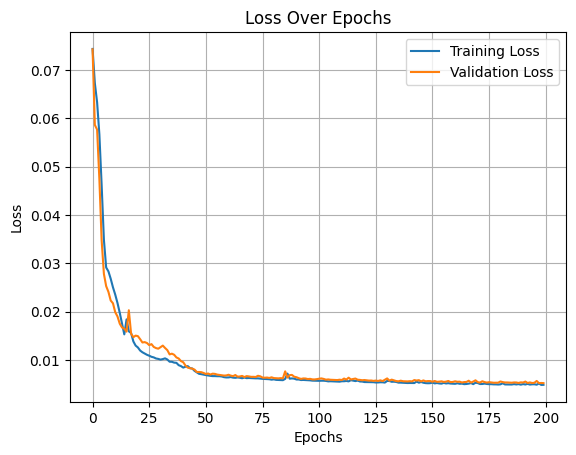

In [9]:
# Plot Loss Graph
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title("Loss Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


In [10]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from sklearn.metrics import mean_squared_error


# Function to calculate PSNR
def calculate_psnr(originals, denoised):
    psnr_values = []
    for i in range(len(originals)):
        psnr_value = psnr(originals[i], denoised[i], data_range=1.0)
        psnr_values.append(psnr_value)
    return np.mean(psnr_values)
# Function to calculate MSE
def calculate_mse(originals, denoised):
    mse_values = []
    for i in range(len(originals)):
        mse_value = mean_squared_error(originals[i].flatten(), denoised[i].flatten())
        mse_values.append(mse_value)
    return np.mean(mse_values)

# Calculate Metrics
avg_psnr = calculate_psnr(x_test, predictions)
avg_mse = calculate_mse(x_test, predictions)

print(f"Peak Signal-to-Noise Ratio (PSNR): {avg_psnr:.2f}")
print(f"Mean Squared Error (MSE): {avg_mse:.4f}")

Peak Signal-to-Noise Ratio (PSNR): 23.75
Mean Squared Error (MSE): 0.0052


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


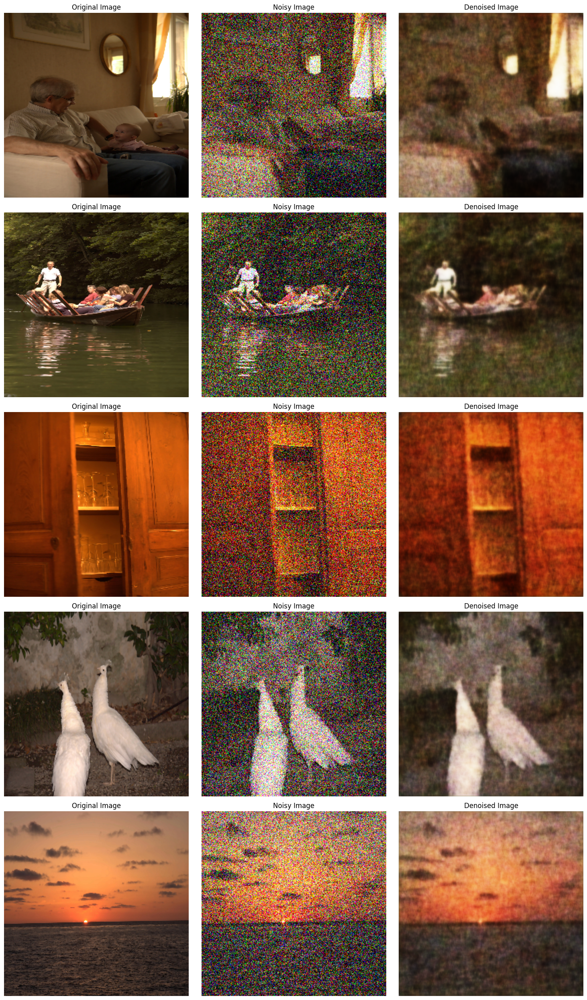

In [11]:
# Step 6: Predict and Visualize
def visualize_multiple_results(originals, noisies, denoiseds, count=5):
    """
    Display multiple original, noisy, and denoised images side by side.
    """
    plt.figure(figsize=(15, 5 * count))
    for i in range(count):
        index = np.random.randint(len(originals))
        # Original Image
        ax = plt.subplot(count, 3, i * 3 + 1)
        plt.imshow(originals[index])
        plt.title("Original Image")
        plt.axis("off")
        # Noisy Image
        ax = plt.subplot(count, 3, i * 3 + 2)
        plt.imshow(noisies[index])
        plt.title("Noisy Image")
        plt.axis("off")
        # Denoised Image
        ax = plt.subplot(count, 3, i * 3 + 3)
        plt.imshow(denoiseds[index])
        plt.title("Denoised Image")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Predict on test data
predictions = model.predict(x_test_noisy)

# Visualize 5 random results
visualize_multiple_results(x_test, x_test_noisy, predictions, count=5)

In [ ]:
#Resnet inspired Autoencoder

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 256, 256, 64)   │              0 │ conv2d_2[0][0],        │
│                           │                        │                │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ add[0][0]              │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 128, 128, 128)  │              0 │ conv2d_5[0][0],        │
│                           │                        │                │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ add_1[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ conv2d_7[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 64, 64, 256)    │              0 │ conv2d_8[0][0],        │
│                           │                        │                │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 256)    │              0 │ add_2[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)   

 Total params: 11,656,899 (44.47 MB)

 Trainable params: 11,656,899 (44.47 MB)

 Non-trainable params: 0 (0.00 B)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 241s 57s/step - loss: 36.4191 - val_loss: 39.4204
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - loss: 39.3417 - val_loss: 37.3650
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 38.3431 - val_loss: 37.5115
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - loss: 36.3200 - val_loss: 33.9793
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 31.5035 - val_loss: 28.6592
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - loss: 27.9428 - val_loss: 26.2217
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 25.5685 - val_loss: 25.0887
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 24.1434 - val_loss: 24.2776
Epoch 9/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - loss: 23.3897 - val_loss: 23.7557
Epoch 10/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 23.1823 - val_loss: 23.6194
Epoch 11/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 22.5052 - val_loss: 22.9420
Epoch 12/20

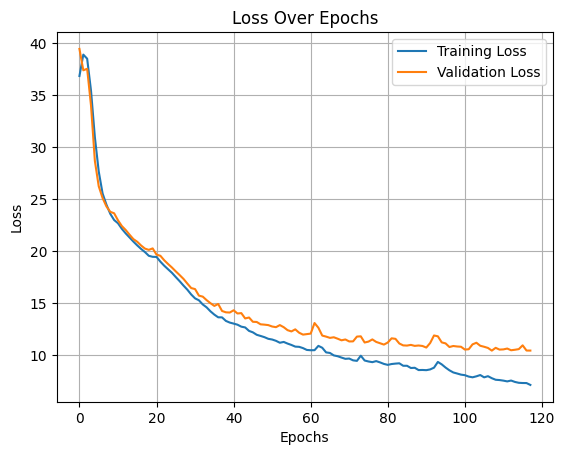

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Add, Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from keras.models import Model
from keras.optimizers import Adam
from keras.applications import VGG16
from keras.losses import MeanSquaredError
from keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.metrics import peak_signal_noise_ratio as psnr
from sklearn.metrics import mean_squared_error

# Step 1: Load Images
def load_images(folder_path, target_size=(256, 256)):
    images = []
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(folder_path, filename)
            img = load_img(img_path, target_size=target_size)
            img_array = img_to_array(img).astype('float32') / 255.0
            images.append(img_array)
    return np.array(images)

# Provide dataset directory path
folder_path = "/content/drive/MyDrive/deeeep/deep learning project"  # Replace with your dataset path
images = load_images(folder_path)
if len(images) == 0:
    raise ValueError("No images found in the provided folder path.")
#print(f"Loaded {len(images)} images with shape {images[0].shape}.")

# Step 2: Add Noise
def add_noise(images, noise_factor=0.2):
    noisy_images = images + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=images.shape)
    return np.clip(noisy_images, 0., 1.)

noisy_images = add_noise(images)

# Step 3: Split Data
split_idx = int(len(images) * 0.8)
x_train, x_test = images[:split_idx], images[split_idx:]
x_train_noisy, x_test_noisy = noisy_images[:split_idx], noisy_images[split_idx:]

# Step 4: Define Residual Block
def residual_block(x, filters, kernel_size=(3, 3)):
    residual = Conv2D(filters, kernel_size, activation=None, padding='same')(x)
    x = Conv2D(filters, kernel_size, activation='relu', padding='same')(x)
    x = Conv2D(filters, kernel_size, activation=None, padding='same')(x)
    return Add()([x, residual])

# Step 5: Define Autoencoder with More Capacity
def improved_autoencoder(input_shape=(256, 256, 3)):
    inputs = Input(shape=input_shape)

    # Encoder
    c1 = residual_block(inputs, 64)
    p1 = MaxPooling2D((2, 2), padding='same')(c1)

    c2 = residual_block(p1, 128)
    p2 = MaxPooling2D((2, 2), padding='same')(c2)

    c3 = residual_block(p2, 256)
    p3 = MaxPooling2D((2, 2), padding='same')(c3)

    # Bottleneck
    bn = residual_block(p3, 512)

    # Decoder
    u3 = UpSampling2D((2, 2))(bn)
    u3 = concatenate([u3, c3])
    d3 = residual_block(u3, 256)

    u2 = UpSampling2D((2, 2))(d3)
    u2 = concatenate([u2, c2])
    d2 = residual_block(u2, 128)

    u1 = UpSampling2D((2, 2))(d2)
    u1 = concatenate([u1, c1])
    d1 = residual_block(u1, 64)

    outputs = Conv2D(3, (1, 1), activation='sigmoid')(d1)
    return Model(inputs, outputs)

# Create the Autoencoder Model
autoencoder = improved_autoencoder()
autoencoder.summary()

# Step 6: Perceptual Loss
vgg = VGG16(include_top=False, weights="imagenet", input_shape=(256, 256, 3))
vgg.trainable = False
perceptual_layer = Model(inputs=vgg.input, outputs=vgg.get_layer("block3_conv3").output)

def perceptual_loss(y_true, y_pred):
    y_true_features = perceptual_layer(y_true)
    y_pred_features = perceptual_layer(y_pred)
    return MeanSquaredError()(y_true_features, y_pred_features)

# Compile Model
autoencoder.compile(optimizer=Adam(learning_rate=0.0001), loss=perceptual_loss)

# Step 7: Define Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,  # Stop if val_loss does not improve for 10 epochs
    restore_best_weights=True,
    verbose=1
)

# Step 8: Train the Model
history = autoencoder.fit(
    x_train_noisy,
    x_train,
    validation_data=(x_test_noisy, x_test),
    epochs=200,
    batch_size=32,
    callbacks=[early_stopping]
)

# Step 9: Calculate PSNR and MSE
def calculate_psnr(originals, denoised):
    psnr_values = []
    for i in range(len(originals)):
        psnr_value = psnr(originals[i], denoised[i], data_range=1.0)
        psnr_values.append(psnr_value)
    return np.mean(psnr_values)

def calculate_mse(originals, denoised):
    mse_values = []
    for i in range(len(originals)):
        mse_value = mean_squared_error(originals[i].flatten(), denoised[i].flatten())
        mse_values.append(mse_value)
    return np.mean(mse_values)

# Predict on test data
predictions = autoencoder.predict(x_test_noisy)

# Calculate Metrics
avg_psnr = calculate_psnr(x_test, predictions)
avg_mse = calculate_mse(x_test, predictions)

print(f"Peak Signal-to-Noise Ratio (PSNR): {avg_psnr:.2f}")
print(f"Mean Squared Error (MSE): {avg_mse:.4f}")

# Step 10: Plot Loss Graph
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title("Loss Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


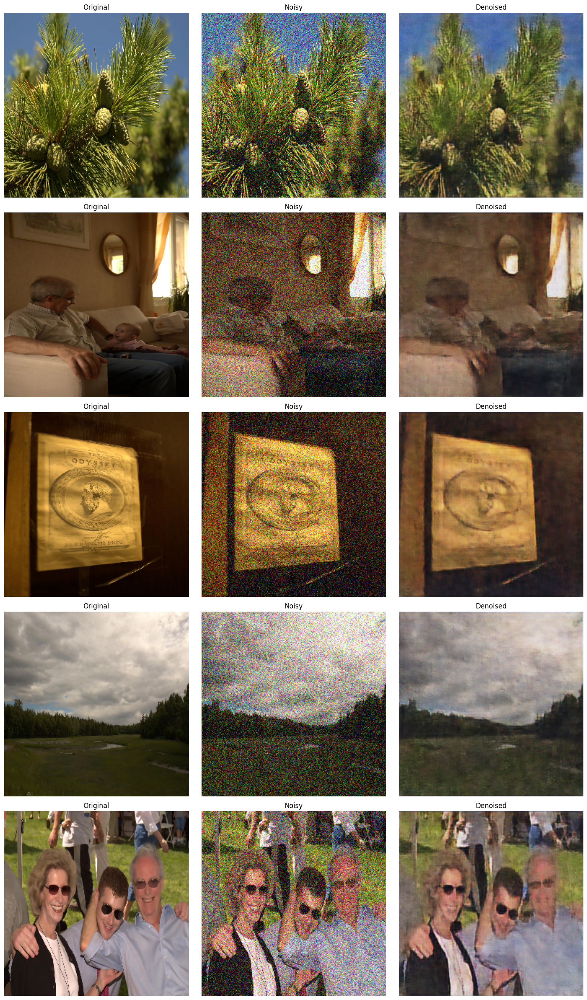

In [3]:
# Step 8: Visualize Results
def visualize_results(original, noisy, denoised, count=5):
    plt.figure(figsize=(15, 5 * count))
    for i in range(count):
        idx = np.random.randint(len(original))
        # Original
        plt.subplot(count, 3, i * 3 + 1)
        plt.imshow(original[idx])
        plt.title("Original")
        plt.axis("off")
        # Noisy
        plt.subplot(count, 3, i * 3 + 2)
        plt.imshow(noisy[idx])
        plt.title("Noisy")
        plt.axis("off")
        # Denoised
        plt.subplot(count, 3, i * 3 + 3)
        plt.imshow(denoised[idx])
        plt.title("Denoised")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Predict and Visualize
denoised_images = autoencoder.predict(x_test_noisy)
visualize_results(x_test, x_test_noisy, denoised_images)